# End-to-End Multi-class Dog Breed Classification

This notebook builds and end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Given an image of a dog, identifying its breed.

##  2. Data

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probablities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

* The dataset comprises 120 breeds of dogs. Therefore, there are 120 classes.
* There are 10,000+ images in both training and test sets.


In [ ]:
# Unzip the dataset into a Google Drive folder.
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision"

### Getting the workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Ensure a GPU is being used

In [ ]:
# Importing TensorFlow
import tensorflow as tf
print("TensorFlow Version:", tf.__version__)

TensorFlow Version: 2.8.0


In [ ]:
# Importing TensorFlow Hub
import tensorflow_hub as hub
print("TensorFlow Hub Version:", hub.__version__)

TensorFlow Hub Version: 0.12.0


In [ ]:
# Checking for GPU availability
print("GPU", "Available" if tf.config.list_physical_devices("GPU") else "Not Available")

GPU Available


Change runtime to use a GPU from Runtime > Change run time type.

In [ ]:
# Checking for GPU availability
print("GPU", "Available" if tf.config.list_physical_devices("GPU") else "Not Available")

GPU Available


## Getting the data ready (Converting the data into Tensors)

Tensors are numerical representations of the data/images. The images are essentialy convered into images.

In [ ]:
# Accessing data and checking labels
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

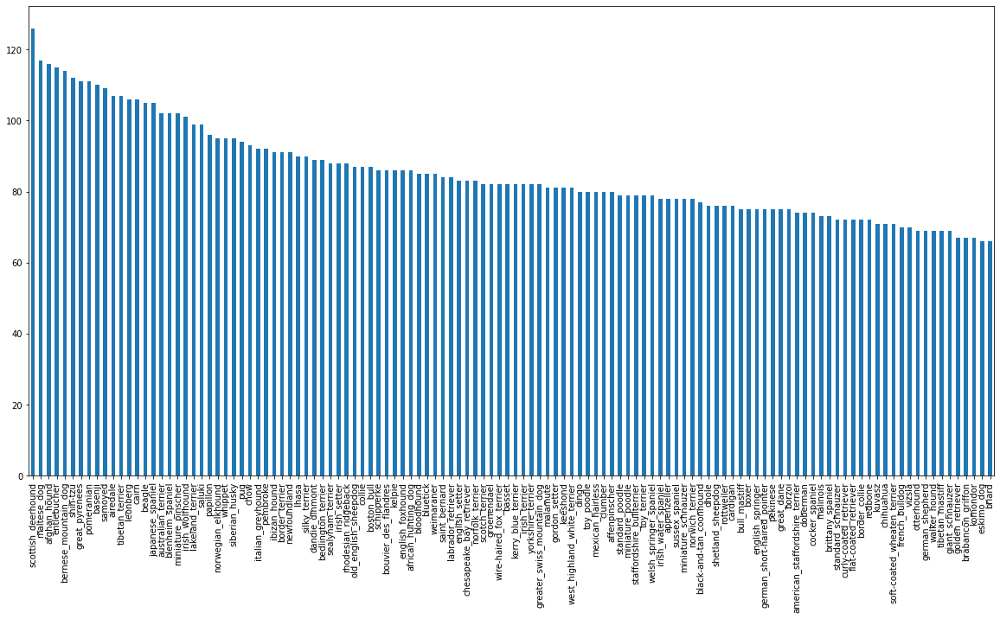

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize = [20, 10])

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

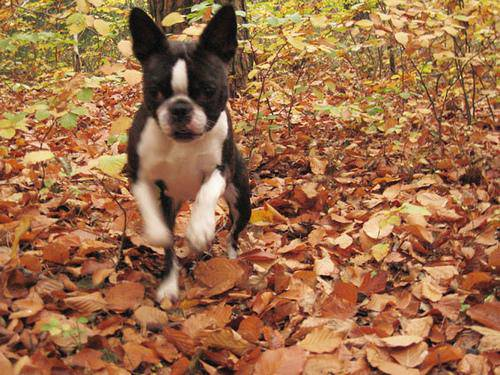

In [ ]:
# Displaying an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")


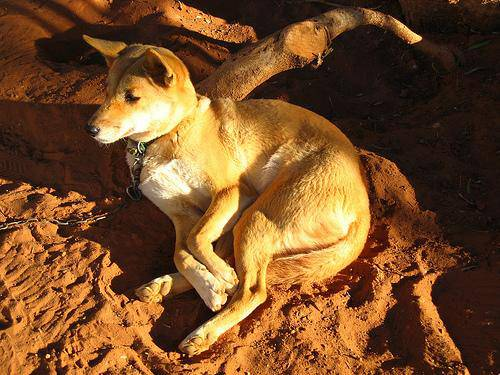

In [ ]:
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels ready

In [ ]:
# Getting a list of all of image file pathnames from image id's
filenames = [fname for fname in labels_csv["id"]]

filenames[:10]

['000bec180eb18c7604dcecc8fe0dba07',
 '001513dfcb2ffafc82cccf4d8bbaba97',
 '001cdf01b096e06d78e9e5112d419397',
 '00214f311d5d2247d5dfe4fe24b2303d',
 '0021f9ceb3235effd7fcde7f7538ed62',
 '002211c81b498ef88e1b40b9abf84e1d',
 '00290d3e1fdd27226ba27a8ce248ce85',
 '002a283a315af96eaea0e28e7163b21b',
 '003df8b8a8b05244b1d920bb6cf451f9',
 '0042188c895a2f14ef64a918ed9c7b64']

In [ ]:
filepaths = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in filenames]

filepaths[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Checking the number of filenames/filepaths against the actual number of files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train")) == len(filepaths):
  print("File numbers match!")
else:
  print("File numbers do not match.")

File numbers match!


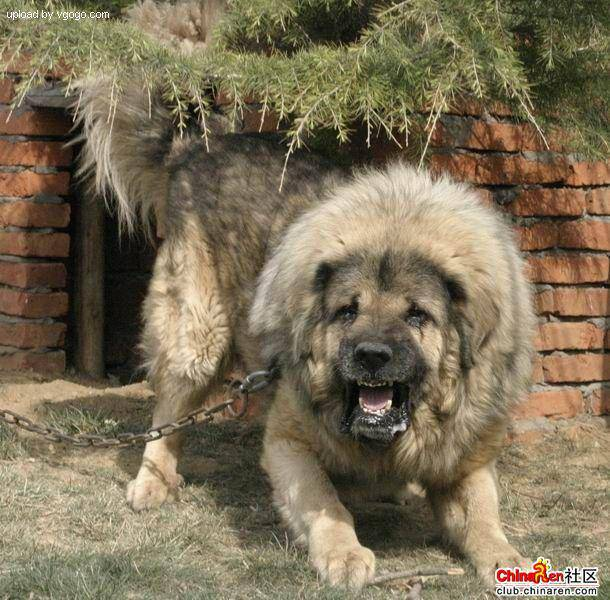

In [ ]:
Image(filepaths[9000])


In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

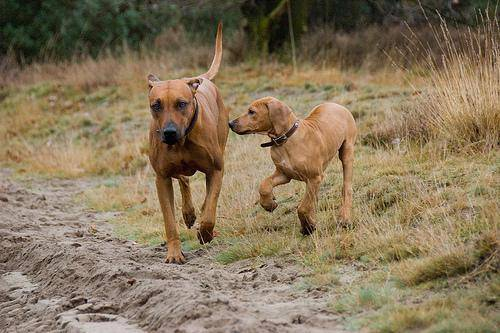

In [ ]:
Image(filepaths[10100])

In [ ]:
labels_csv["breed"][10100]

'rhodesian_ridgeback'

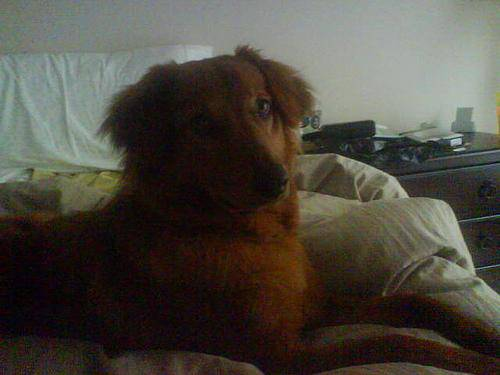

In [ ]:
Image(filepaths[1000])

In [ ]:
labels_csv["breed"][1000]

'irish_setter'

Traing image filepaths are in a list, labels can be prepared.

In [ ]:
labels = labels_csv["breed"]
labels

0                     boston_bull
1                           dingo
2                        pekinese
3                        bluetick
4                golden_retriever
                   ...           
10217                      borzoi
10218              dandie_dinmont
10219                    airedale
10220          miniature_pinscher
10221    chesapeake_bay_retriever
Name: breed, Length: 10222, dtype: object

In [ ]:
import numpy as np
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# Checking to see if the number of labels matches the number of filenames
if len(labels) == len(filepaths):
  print("Numbers match!")
else:
  print("Numbers do not match.")


Numbers match!


In [ ]:
# Finding the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turning a single label to an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turning every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Turning a boolean array into integers
print(labels[0]) # Original label
print(np.where(unique_breeds == labels[0])) # Index where label occurs
print(boolean_labels[0].argmax()) # Index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # Adding a 1 to where the label occurs


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating a validation set


In [ ]:
# Setting up X and y variables
X = filepaths
y = boolean_labels

Experimenting with ~1000 images, and increasing the number as needed.

In [ ]:
# Setting number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: "slider", min: 1000, max: 10000, step: 1000}

In [ ]:
# Splitting data into train and validation sets
from sklearn.model_selection import train_test_split

# Splitting in train and validation sets of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)

In [ ]:
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Images (Turning Images Into Tensors)

Here is how importing an image is done.


In [ ]:
# Converting an image into a NumPy Array
from matplotlib.pyplot import imread
image = imread(filepaths[42])
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
# Converting the NumPy array into a Tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

Creating a function that does the following:

1. Takes an image filepath as input.
2. Uses TensorFlow to read the file and saves it to a variable `image`.
3. Turns the `image` (.jpg file) into a Tensors.
4. Normalizes the `image` (converts colour channel values from 0-255 to 0-1).
5. Resizes the `image` to be a shape of (224, 224).
6. Returns the modified `image`.

In [ ]:
IMG_SIZE = 224

def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image filepath and turns the image into a Tensor.
  """
  # Reading an image file
  image = tf.io.read_file(image_path)
  # Turning the jpeg image into a numerical Tensor with 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image, channels = 3)
  # Convert the colour channel values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resizing the image
  image = tf.image.resize(image, size = [img_size, img_size])

  return image


## Turning Data into Batches

Using batches of 32 images at a time. 

Data needs to be in the form of tensor tuples: `(image, label)`.

In [ ]:
# Creating a function that returns a tuple (image, label) of Tensors image and label
def get_image_label(image_path, label):
  """
  Takes an image filepath and the associated label,
  processes the image and returns a tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(X[42]), y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
BATCH_SIZE = 32

# Creating a function to turn data into batches
def create_data_batches(X, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Data is shuffled if it is training data, and not shuffled if it is validation data.
  Also accepts test data as input (no labels).
  """
  
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) 
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), 
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling filepaths and labels before mapping image processor function is faster.
    data = data.shuffle(buffer_size = len(X))
    # Creating (image, label) tuples
    data = data.map(get_image_label)
    # Turning the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [ ]:
import matplotlib.pyplot as plt

# Creating a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setting up the figure
  plt.figure(figsize = (10, 10))
  # Creating a loop for displaying 25 images
  for i in range(25):
    # Creating subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i + 1)
    # Displaying the image
    plt.imshow(images[i])
    # Adding the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turning the grid lines off
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.6446429 , 0.67601544, 0.7191527 ],
          [0.6362483 , 0.6715424 , 0.7068365 ],
          [0.6270679 , 0.66236204, 0.6819699 ],
          ...,
          [0.25161943, 0.24864319, 0.16621357],
          [0.28688326, 0.2637127 , 0.1985397 ],
          [0.2737731 , 0.24668846, 0.18394336]],
 
         [[0.6503677 , 0.67601544, 0.7220151 ],
          [0.6449405 , 0.6745098 , 0.71266633],
          [0.63288933, 0.66245866, 0.6849289 ],
          ...,
          [0.26603645, 0.2656926 , 0.17466736],
          [0.2649884 , 0.25094458, 0.17691709],
          [0.2808473 , 0.26172575, 0.19039348]],
 
         [[0.6592241 , 0.67804414, 0.72542894],
          [0.6506677 , 0.6739146 , 0.7147035 ],
          [0.64106447, 0.66540617, 0.6969975 ],
          ...,
          [0.28387788, 0.2848232 , 0.18084913],
          [0.2576539 , 0.25483918, 0.16849858],
          [0.24993677, 0.24562348, 0.16072325]],
 
         ...,
 
         [[0.84596086, 0.93289196, 0.6785671 ],
          [0.81772

In [ ]:
len(train_images), len(train_labels)

(32, 32)

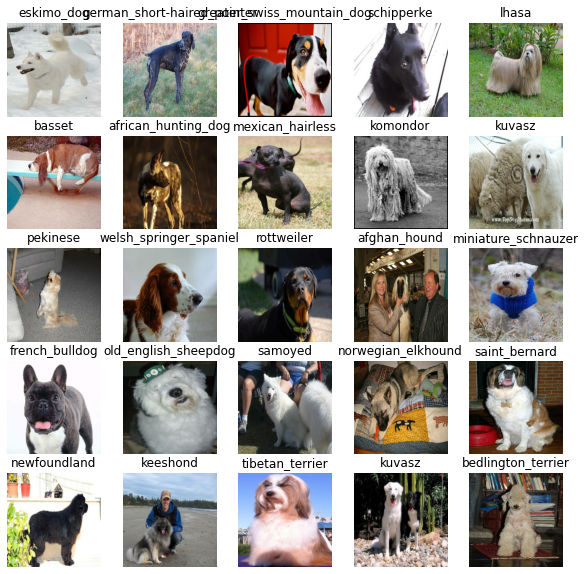

In [ ]:
show_25_images(train_images, train_labels)

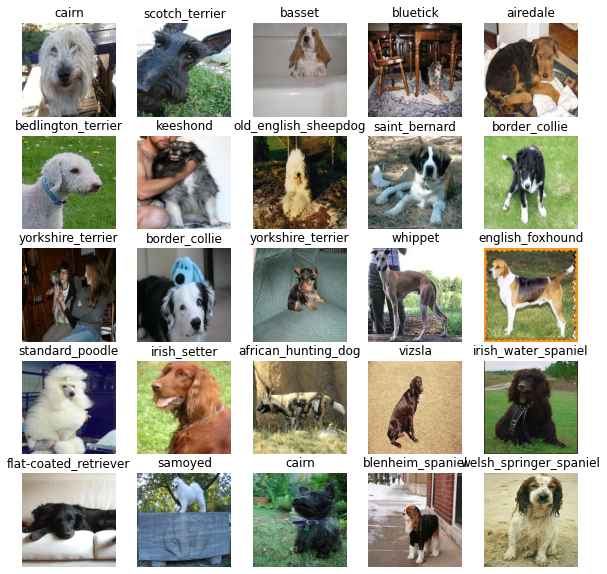

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building A Model

Before building a model, there are a few things which need to be defined:

* The input shape (images shape, in the form of Tensors)
* The output shape (image labels, in the form of Tensors)
* The URL of the model to be used

In [ ]:
# Setting up the input shape
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batch, Height, Width, Colour Channels

# Setting up the output shape
OUTPUT_SHAPE = len(unique_breeds)

# Setting the model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Creating a function that:

* Takes the input shape, output shape and the chosen model as parameters,
* Defines the layers in a Keras model in sequential fashion,
* Compiles the model (including how it should be evaluated and improved),
* Builds the model,
* Returns the model.

These steps are explained here: https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
# Creating a function that builds a Keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building a model with:", MODEL_URL)

  # Setting up model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units = OUTPUT_SHAPE, activation = "softmax") # Layer 2 (output layer)
  ])

  # Compiling the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Building the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building a model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks

Callbacks are helper functions a model can use during training to save its progress, check its progress or stop training early if the performance is not improving.

### TensorBoard Callback

To set up a TensorBoard callback, the following steps should be taken:
1. Loading the TensorBoard notebook extension
2. Creating a TensorBoard callback which is able to save logs to a directory and pass it to the model's `fit()` function.
3. Visualizing the model's training logs with the `%tensorboard` magic function (done after model training).

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join("drive/MyDrive/Dog Vision/Logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps the model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)

## Training A Model (On A Subset of Data)

To ensure everything is working correctly, the first model is only going to train on 1000 images.

In [ ]:
NUM_EPOCHS = 100 #@param{type: "slider", min: 10, max: 100, step: 10}

In [ ]:
print("GPU", "Available" if tf.config.list_physical_devices("GPU") else "NOT Available")

GPU Available


Steps to create a function that trains a model:

* Creating a model using `create_model()`
* Setting up a TensorBoard callback using `create_tensorboard_callback()`
* Calling the `fit()` function on the model, passing it the training data, validation data, number of epochs to train for (NUM_EPOCH) and the callbacks to be used
* Returning the model

In [ ]:
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  model = create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  return model 

In [ ]:
model = train_model()

Building a model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 153s 6s/step - loss: 4.6427 - accuracy: 0.0938 - val_loss: 3.5120 - val_accuracy: 0.2250
Epoch 2/100
25/25 [==============================] - 5s 189ms/step - loss: 1.6815 - accuracy: 0.6775 - val_loss: 2.1822 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 5s 201ms/step - loss: 0.5903 - accuracy: 0.9337 - val_loss: 1.6893 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 5s 198ms/step - loss: 0.2640 - accuracy: 0.9887 - val_loss: 1.4891 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 5s 189ms/step - loss: 0.1506 - accuracy: 0.9987 - val_loss: 1.4206 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 5s 197ms/step - loss: 0.1027 - accuracy: 1.0000 - val_loss: 1.3733 - val_accuracy: 0.6400
Epoch 7/100
25/25 [=============================

**Ways to prevent model overfitting**

### Checking the TensorBoard Logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory and visualize its content.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/Logs # This is in essence a command to be entered on the command line, so it follows that syntax/format.

Reusing TensorBoard on port 6006 (pid 470), started 0:00:12 ago. (Use '!kill 470' to kill it.)

<IPython.core.display.Javascript object>

## Making Predictions & Evaluating Them Using A Trained Model

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Making predictions on the validation data (Not used to train on)
preds = model.predict(val_data, verbose = 1)
preds

7/7 [==============================] - 2s 161ms/step


array([[1.47273322e-03, 1.45018537e-04, 1.88340212e-03, ...,
        4.83138429e-04, 1.72549389e-05, 3.69786355e-03],
       [9.93185909e-04, 5.14386084e-05, 5.37530938e-03, ...,
        1.27858948e-04, 1.37200486e-03, 6.71039525e-05],
       [1.34730712e-04, 1.25135293e-05, 1.36072676e-05, ...,
        1.63899876e-05, 1.05418912e-05, 1.66252466e-05],
       ...,
       [1.04228875e-05, 1.27542939e-04, 3.19372884e-05, ...,
        4.60833398e-05, 2.08281617e-05, 5.87923860e-05],
       [1.33981428e-03, 1.44047313e-04, 2.54668150e-04, ...,
        1.68425715e-04, 7.02857214e-05, 5.16089704e-03],
       [1.01545546e-03, 1.29119626e-05, 3.30394646e-03, ...,
        2.67341104e-03, 3.08809133e-04, 3.85528147e-05]], dtype=float32)

In [ ]:
preds.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
len(preds[0])

120

There are 200 images in the predictions set, each having 120 different probabilities assigned to it. The probabilities indicate the model's assesment of how likely it is that each image belongs to a certain label.

In [ ]:
np.sum(preds[0])

0.9999999

In [ ]:
np.sum(preds[1])

0.9999999

In [ ]:
index = 0
print(preds[index])
print(f"Max Value (Max Probability): {np.max(preds[index])}")
print(f"Sum of Probabilities: {np.sum(preds[index])}")
print(f"Index of Max Probability: {np.argmax(preds[index])}")
print(f"Predicted Label: {unique_breeds[np.argmax(preds[index])]}")

[1.47273322e-03 1.45018537e-04 1.88340212e-03 3.12392331e-05
 2.12142244e-04 1.67856109e-04 6.87117353e-02 2.27707977e-04
 2.80590117e-04 5.93534147e-04 4.52886961e-05 1.36254457e-05
 3.59294034e-04 4.19605240e-05 1.90253602e-04 2.66621704e-03
 9.93721478e-05 6.43088371e-02 1.10262961e-04 3.32989948e-05
 1.28148240e-03 3.20909690e-04 1.90671708e-05 9.83729493e-04
 2.35631906e-05 8.83405213e-04 3.74310344e-01 7.49676910e-05
 1.64584606e-03 1.08781387e-03 6.80099911e-05 2.72186502e-04
 2.34542764e-04 1.78371847e-05 2.34336738e-04 3.86013091e-02
 3.43422253e-05 9.18442820e-05 6.12872391e-05 1.09472009e-03
 2.57473876e-04 2.84242014e-05 2.53072340e-05 2.08302677e-04
 3.67495704e-05 2.58130429e-04 7.03480982e-05 3.68009001e-04
 9.59957542e-04 5.32590057e-05 5.01581177e-04 3.50171613e-05
 7.09781831e-04 2.91560445e-05 1.31689576e-05 5.41262489e-05
 4.27739025e-04 5.75847982e-04 1.06597680e-03 8.30105320e-02
 1.17976968e-04 6.68450302e-05 2.19690497e-03 3.03009529e-05
 2.72965262e-04 1.189830

In [ ]:
index = 42
print(preds[index])
print(f"Max Value (Max Probability): {np.max(preds[index])}")
print(f"Sum of Probabilities: {np.sum(preds[index])}")
print(f"Index of Max Probability: {np.argmax(preds[index])}")
print(f"Predicted Label: {unique_breeds[np.argmax(preds[index])]}")

[1.20754623e-04 2.58990040e-04 3.98073535e-05 1.08212364e-04
 4.99576656e-03 1.62161654e-04 6.34874275e-04 2.37132958e-03
 1.20113874e-02 4.37461063e-02 9.60066172e-05 9.51151524e-05
 1.39427662e-04 4.18204861e-03 1.54112058e-03 1.65082689e-03
 8.09678968e-05 3.43728316e-04 1.77678507e-04 1.03229577e-04
 1.84682431e-04 5.33575600e-04 3.14848090e-04 9.89063701e-05
 2.50445902e-02 2.55990773e-04 1.07321510e-04 1.44865466e-04
 9.09717288e-04 1.14252194e-04 5.82692330e-04 4.43778321e-04
 4.75753332e-05 7.09875676e-05 2.52266211e-04 1.64275611e-04
 6.64127641e-04 4.44397971e-04 3.67727480e-04 2.34561369e-01
 1.47191386e-04 7.18259253e-05 3.76925198e-03 1.72853197e-05
 1.98310547e-04 6.11276846e-05 4.97684523e-04 9.62127117e-04
 9.30265378e-05 7.03922356e-04 1.49565807e-04 9.67328597e-05
 1.78615050e-03 3.16178193e-03 3.24225257e-05 2.28487304e-04
 2.09667225e-04 1.24987288e-04 4.94395354e-05 9.58074961e-05
 1.84495118e-04 1.32699229e-03 1.56856277e-05 3.53168398e-05
 2.51754158e-04 6.193423

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turning the prediction probabilities into their respective labels
def get_pred_label(pred_probs):
  """
  Turns an array of predicted probabilities into a label.
  """
  return unique_breeds[np.argmax(pred_probs)]

pred_label = get_pred_label(preds[120])
pred_label


'beagle'

The validation data is still in the batch format, it needs to be "unbatchified" in order to make predictions on the validation images and compare them to validation labels (truth labels).

In [ ]:
# Example
images_ = []
labels_ = []

for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(preds[0])

'cairn'

In [ ]:
# Creating a function to unbatch a batched dataset
def unbatchify(batch_data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images_ = []
  labels_ = []

  for image, label in batch_data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  
  return images_, labels_

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now that it is possible to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images,

the whole thing can be put together in order to visualize it better.

Creating a function that:
* as inputs, takes an array of predicted probabilities, an array of truth labels and an array of images and an integer,
* converts the predicted probabilities to a predicted label,
* plots the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(pred_probs, labels, images, n = 1):
  """
  View the prediction, ground truth and image for sample n.
  """
  pred_prob, truth_label, image = pred_probs[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == truth_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob) * 100,
                                    truth_label),
                                    color = color)

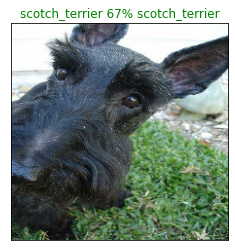

In [ ]:
plot_pred(preds, val_labels, val_images)

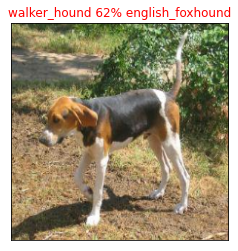

In [ ]:
plot_pred(preds, val_labels, val_images, n = 42)

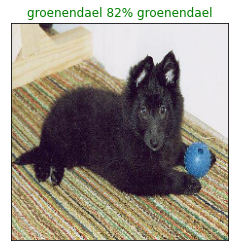

In [ ]:
plot_pred(preds, val_labels, val_images, n = 77)

Creating a function that displays the model's top 10 predictions:

* Takes an input of predicted probabilities array and a ground truth array and an integer,
* Finds the prediction using the `get_pred_label`,
* Finds the top 10 predictions:
  * predicted probabilities indexes
  * predicted probabilities values
  * predicted labels
* Plots the top 10 predicted probabilities values and labels, colouring the true label green.

`argsort()` returns an array that shows the index associated with each element that would sort the array in an ascending fashion. For example, `[12, 3, 6, 7, 2].argsort() = [4, 1, 2, 3, 9]`.



In [ ]:
def plot_pred_conf(pred_probs, labels, n = 1):
  """
  Plot the top 10 highest predicted probabilities (confidence levels) along with the truth label for sample n.
  """

  pred_prob, true_label = pred_probs[n], labels[n]
  pred_label = get_pred_label(pred_prob)

  top10_pred_index = pred_prob.argsort()[-10:][::-1] # Reversing the order of the indexes in the array to be in descending order
  top10_pred_values = pred_prob[top10_pred_index]
  top10_pred_labels = unique_breeds[top10_pred_index]

  top_plot = plt.bar(np.arange(len(top10_pred_labels)),
                              top10_pred_values,
                              color = "grey")
  plt.xticks(np.arange(len(top10_pred_labels)),
                       labels = top10_pred_labels,
                       rotation = "vertical")
  if np.isin(true_label, top10_pred_labels):
    top_plot[np.argmax(top10_pred_labels == true_label)].set_color("green")
  else:
    pass


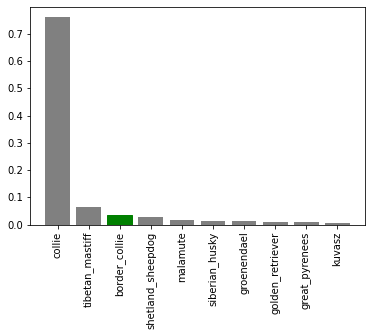

In [ ]:
plot_pred_conf(preds, val_labels, n = 9)

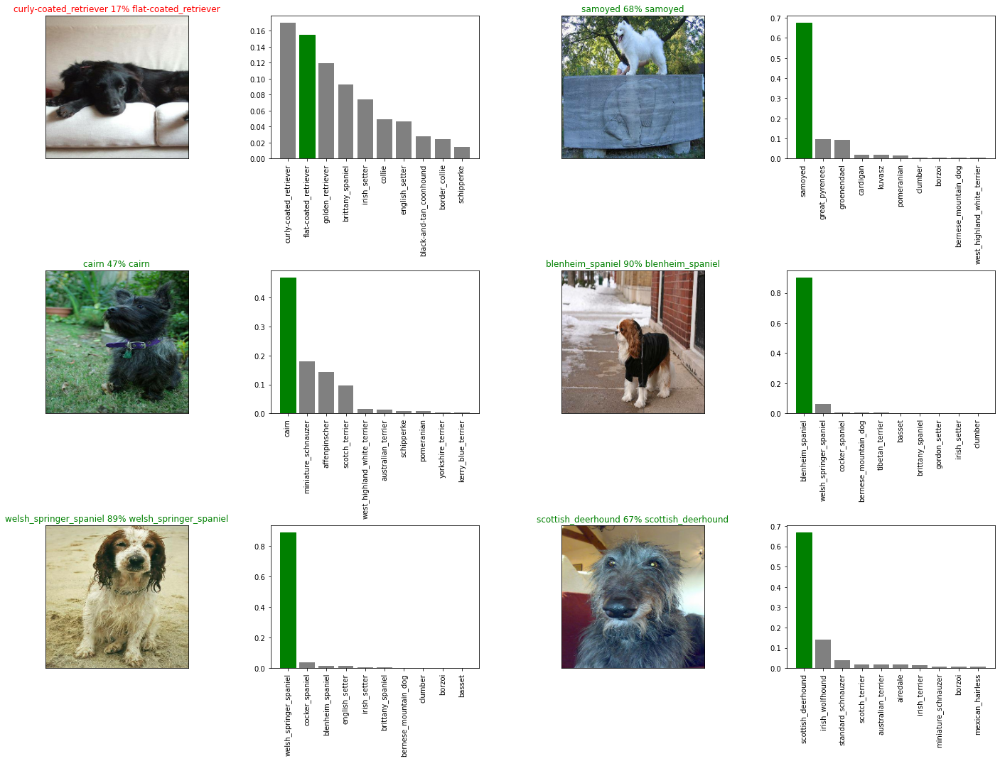

In [ ]:
# Plotting a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_imgs = num_rows * num_cols
plt.figure(figsize = (10 * num_cols, 5 * num_rows))
for i in range(num_imgs):
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
  plot_pred(preds, val_labels, val_images, i + i_multiplier) 
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  plot_pred_conf(preds, val_labels, i + i_multiplier)
  
plt.tight_layout(h_pad = 1.0) 
plt.show()

## Confusion matrix

In [ ]:
#tf.math.confusion_matrix(val_labels, preds)

## Saving & Reloading A Trained Model

In [ ]:
def save_model(model, suffix = None):
  """
  Saves a given model to a directory and appends a suffix (string).
  """
  modeldir = os.path.join("drive/MyDrive/Dog Vision/Models",
                          datetime.datetime.now().strftime("%Y%M%D-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path


In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}...")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer": hub.KerasLayer})
  return model

In [ ]:
save_model(model, suffix = "1000-imgs-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/Models/20223905/06/22-173919-1000-imgs-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/Models/20223905/06/22-173919-1000-imgs-mobilenetv2-Adam.h5'

In [ ]:
loaded_1000_img_model = load_model("drive/MyDrive/Dog Vision/Models/20223905/06/22-173919-1000-imgs-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/Models/20223905/06/22-173919-1000-imgs-mobilenetv2-Adam.h5...


In [ ]:
loaded_1000_img_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_1 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 120ms/step - loss: 1.2826 - accuracy: 0.6450


[1.2825899124145508, 0.6449999809265137]

In [ ]:
loaded_1000_img_model.evaluate(val_data)

7/7 [==============================] - 2s 122ms/step - loss: 1.2826 - accuracy: 0.6450


[1.2825899124145508, 0.6449999809265137]

## Training A Model On The Full Data

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
 X[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
X_train[:10]

['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg',
 'drive/MyDrive/Dog Vision/train/0ea5759640f2e1c2d1a06adaf8a54ca7.jpg',
 'drive/MyDrive/Dog Vision/train/03e1d2ee5fd90aef036c90a9e7f81177.jpg',
 'drive/MyDrive/Dog Vision/train/16941a6728ddb9cb7423a6cc97fbe071.jpg',
 'drive/MyDrive/Dog Vision/train/0bedbecd92390ef9f4f7c8b06a629340.jpg',
 'drive/MyDrive/Dog Vision/train/143b9484273e57668d03bfc26755810a.jpg']

In [ ]:
len(X_train)

800

In [ ]:
# Creating a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Creating a model
full_model = create_model()

Building a model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Creating full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation sets when training on full data, so can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy", patience = 3)

In [ ]:
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1134s 4s/step - loss: 1.3506 - accuracy: 0.6697
Epoch 2/100
320/320 [==============================] - 52s 162ms/step - loss: 0.4041 - accuracy: 0.8811
Epoch 3/100
320/320 [==============================] - 50s 155ms/step - loss: 0.2381 - accuracy: 0.9338
Epoch 4/100
320/320 [==============================] - 51s 158ms/step - loss: 0.1555 - accuracy: 0.9632
Epoch 5/100
320/320 [==============================] - 52s 161ms/step - loss: 0.1080 - accuracy: 0.9773
Epoch 6/100
320/320 [==============================] - 51s 159ms/step - loss: 0.0780 - accuracy: 0.9873
Epoch 7/100
320/320 [==============================] - 54s 168ms/step - loss: 0.0612 - accuracy: 0.9902
Epoch 8/100
320/320 [==============================] - 54s 167ms/step - loss: 0.0455 - accuracy: 0.9944
Epoch 9/100
320/320 [==============================] - 54s 168ms/step - loss: 0.0372 - accuracy: 0.9964
Epoch 10/100
320/320 [==============================] - 53s 166ms

In [ ]:
save_model(full_model, suffix = "full-imgset-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/Models/20224105/06/22-184158-full-imgset-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/Models/20224105/06/22-184158-full-imgset-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model('drive/MyDrive/Dog Vision/Models/20224105/06/22-184158-full-imgset-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/Models/20224105/06/22-184158-full-imgset-mobilenetv2-Adam.h5...


## Making Predictions On the Test Dataset

The model has been trained on images in the form of Tensor batches, so in order to make predictions on the test data, it will need to be converted to the same format.

The `create_data_batches()` function can be used to achieve this.

Steps to take:
* Getting the test images filepaths,
* Converting the filepaths into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True`,
* Making a predictions array by passing the test data batches to the `predict()`
method of the model.

In [ ]:
# Loading test image filepaths
import os
test_filepaths = ["drive/MyDrive/Dog Vision/test/" + fname for fname in os.listdir("drive/MyDrive/Dog Vision/test/")]
test_filepaths[:10]

['drive/MyDrive/Dog Vision/test/e3a55cc9c91da472abbced51d98d6ff6.jpg',
 'drive/MyDrive/Dog Vision/test/de9fc145601771b7a5b7e68822416fb5.jpg',
 'drive/MyDrive/Dog Vision/test/e7be7b911a4cba9fdfa4105ec4776370.jpg',
 'drive/MyDrive/Dog Vision/test/e35b67fc659c84c31bccfbaf1dd0fe5f.jpg',
 'drive/MyDrive/Dog Vision/test/ddf0164ab3a269b179051bdecaea34b0.jpg',
 'drive/MyDrive/Dog Vision/test/e1e79b3edfb3579e46ad914bf755dbbc.jpg',
 'drive/MyDrive/Dog Vision/test/e24b3d1a5a8e001b215f1f692304e8cb.jpg',
 'drive/MyDrive/Dog Vision/test/e7a1b7a42db97df750aeae212a02d9c4.jpg',
 'drive/MyDrive/Dog Vision/test/e293d06016cac647cd289e2008a4623a.jpg',
 'drive/MyDrive/Dog Vision/test/dddb2b191e1b1de4867f6f5e81236312.jpg']

In [ ]:
len(test_filepaths)

10357

In [ ]:
# Creating test data batches
test_data = create_data_batches(test_filepaths, test_data = True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Making predictions on test data batch using the loaded full model
test_preds = loaded_full_model.predict(test_data, verbose = 1)

324/324 [==============================] - 1060s 3s/step


In [ ]:
# Saving the predictions (NumPy array) to a csv file
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_preds, delimiter = ",")

In [ ]:
import numpy as np

In [ ]:
# Loading the predictions (NumPy array) from a csv file
preds_array = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter = ",")

In [ ]:
preds_array[:10]

array([[1.98168593e-08, 2.26602435e-08, 1.12137904e-07, ...,
        5.02603981e-13, 1.24851018e-10, 3.35795697e-10],
       [1.96884514e-13, 8.31792590e-09, 8.41675566e-14, ...,
        6.16639397e-08, 4.16312176e-08, 1.53381738e-10],
       [1.45509617e-07, 6.99848806e-06, 2.92096018e-07, ...,
        1.99626712e-07, 2.58698452e-10, 6.19950598e-08],
       ...,
       [3.38079620e-10, 2.67399280e-09, 1.58291907e-10, ...,
        6.75064171e-10, 3.22525739e-05, 5.52569934e-10],
       [6.14364204e-09, 2.35397923e-09, 2.58327493e-09, ...,
        2.67830219e-13, 1.23472257e-11, 3.18260980e-04],
       [2.11550798e-14, 5.99726796e-11, 2.39281759e-14, ...,
        1.82736630e-06, 1.48203379e-12, 1.49953205e-12]])

In [ ]:
preds_array.shape

(10357, 120)

## Preparing Test Dataset Predictions For Kaggle

The required format for the submission is to place the predicted probability outputs in DataFrame with image ID and a column for each dog breed.

Steps to be taken:
* Creating a Pandas DataFrame with an ID column, as well as columns for each dog breed.
* Adding data to the ID column by extracting the test image ID's from their filepaths.
* Adding data/predited probabilities to each dog breed column.
* Exporting the DataFrame as a CSV file.

In [ ]:
import pandas as pd
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir("drive/MyDrive/Dog Vision/test/")]

In [ ]:
test_ids

['e3a55cc9c91da472abbced51d98d6ff6',
 'de9fc145601771b7a5b7e68822416fb5',
 'e7be7b911a4cba9fdfa4105ec4776370',
 'e35b67fc659c84c31bccfbaf1dd0fe5f',
 'ddf0164ab3a269b179051bdecaea34b0',
 'e1e79b3edfb3579e46ad914bf755dbbc',
 'e24b3d1a5a8e001b215f1f692304e8cb',
 'e7a1b7a42db97df750aeae212a02d9c4',
 'e293d06016cac647cd289e2008a4623a',
 'dddb2b191e1b1de4867f6f5e81236312',
 'e386eaa78980be7183ecfdd32ecd2aab',
 'eaa65260eb9a2f7d3b5484ac97962788',
 'edcd762a5eec11ae0a1e471d576e8be5',
 'ef7462aaef0907fbe406e23a4462f086',
 'f202ad1aaf619f90386d96f5b874eeef',
 'f3135e277d13e886038661fd42fef154',
 'f3535f627d9d45218bd401ec24e250ac',
 'ed8e5c431d6539db02614ddc1f35ce10',
 'ed1f9841f56f9e0122782f734919f521',
 'e89317cab9060dcaa19f1b669d363223',
 'eef97d020c12ab1f73a2927b8271bb41',
 'e816f0027a2c6348dbf12b79c70541bc',
 'ed3c3d91c25ad370e44704caa4bc1c63',
 'f477da1f84ba93e037a7786c0f2a91f4',
 'e90c218d4efd434f20a7e73c81058a7c',
 'f2e0d5786be8d06a284ffd09c056f637',
 'eda4465ceee576ac15e9bba9566c9121',
 

In [ ]:
preds_df["id"] = test_ids

In [ ]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e3a55cc9c91da472abbced51d98d6ff6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,de9fc145601771b7a5b7e68822416fb5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7be7b911a4cba9fdfa4105ec4776370,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e35b67fc659c84c31bccfbaf1dd0fe5f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ddf0164ab3a269b179051bdecaea34b0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,083969d1802423c9d5b1a9f1bb613b67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,0770fe4187dd10984ea1afa07757dc8c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,0763ebab76bfd9cbfaac696cc604d35e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,08d5f16507943be640f4592c9d08a798,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(unique_breeds)] = preds_array

preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e3a55cc9c91da472abbced51d98d6ff6,1.981686e-08,2.266024e-08,1.121379e-07,4.356629e-11,3.615355e-12,5.351299e-11,6.214087e-10,8.642607e-10,2.276710e-10,...,7.943381e-09,6.143000e-11,5.408364e-10,4.269383e-11,1.139243e-09,7.102865e-12,5.424054e-11,5.026040e-13,1.248510e-10,3.357957e-10
1,de9fc145601771b7a5b7e68822416fb5,1.968845e-13,8.317926e-09,8.416756e-14,1.135107e-09,2.294270e-09,3.640647e-08,9.325710e-10,1.193694e-06,1.191783e-06,...,9.913117e-12,3.976830e-12,7.688493e-06,2.698264e-06,6.128381e-08,4.627992e-08,4.491052e-14,6.166394e-08,4.163122e-08,1.533817e-10
2,e7be7b911a4cba9fdfa4105ec4776370,1.455096e-07,6.998488e-06,2.920960e-07,1.018619e-07,9.003837e-10,9.505432e-10,6.099662e-10,4.598818e-09,1.423881e-09,...,1.157510e-09,5.703914e-12,2.091936e-11,1.804038e-09,3.663781e-11,5.277878e-11,1.336858e-09,1.996267e-07,2.586985e-10,6.199506e-08
3,e35b67fc659c84c31bccfbaf1dd0fe5f,1.939951e-11,1.173446e-14,4.999201e-14,2.685345e-13,2.183578e-09,6.829244e-13,7.355687e-15,3.756457e-12,1.927533e-14,...,2.318653e-07,4.420536e-12,5.323313e-12,3.081917e-14,4.542544e-14,1.616121e-13,8.072604e-15,1.417212e-11,3.248406e-13,4.038957e-11
4,ddf0164ab3a269b179051bdecaea34b0,1.218511e-06,1.751010e-08,1.575043e-06,9.247443e-11,7.226802e-07,7.088472e-12,6.213455e-02,2.793900e-07,9.328979e-09,...,7.627854e-08,5.331740e-05,7.469012e-10,3.910264e-10,2.213993e-09,8.231763e-08,1.524264e-04,5.738750e-10,9.815683e-07,2.808459e-01


In [ ]:
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1.csv", index = False)